# IT3385 Machine Learning operations Assignment

### Name: **Cayden Toh**

### Admin Number: **222020T**

### Dataset: **Transaction Records (Anomaly Detection)**

**Use Case:** A company has been experiencing unexplained discrepancies in its financial statements related to department expenses. There are concerns that some employees may be submitting fraudulent expense claims—such as inflated amounts or false transactions—which can lead to significant financial losses for the organization.

![fraud](https://miro.medium.com/v2/resize:fit:768/1*9LjCJPuRo52sPNxkvTX_WA.jpeg)

**Solution:** The model acts as a fraud detection and helps the finance team to identify anomalies in expense claims. This will significantly reduce the time and resources spent investigating the transactions while minimizing financial losses due to fraud.

In [1]:
import warnings
warnings.filterwarnings('ignore')

## Exploratory Data Analysis (EDA)

**Import and read transaction record dataset**

In [2]:
import pandas as pd
data = pd.read_csv('03_transaction_records.csv')
data

,FISCAL_YR,FISCAL_MTH,DEPT_NAME,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT
0,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,6/3/2016,-5.50
1,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,18.31
2,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,21.61
3,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,22.39
4,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,5.44
...,...,...,...,...,...,...,...,...
15151,2022,6,DEPT OF EDUCATION,Academic Support,ENTERPRISE RENT-A-CAR,Car Rental,12/12/2021,52.58
15152,2022,6,DEPT OF EDUCATION,Academic Support,COURTYARD BY MARRIOTT-,Lodging,12/13/2021,14.91
15153,2022,6,DEPT OF EDUCATION,Academic Support,COURTYARD BY MARRIOTT-,Lodging,12/13/2021,111.00
15154,2022,6,DEPT OF EDUCATION,Student Support,PESI,Schools Educational Svc-Not Elsewhere Classified,12/5/2021,99.99


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15156 entries, 0 to 15155
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   FISCAL_YR   15156 non-null  int64  
 1   FISCAL_MTH  15156 non-null  int64  
 2   DEPT_NAME   15156 non-null  object 
 3   DIV_NAME    15156 non-null  object 
 4   MERCHANT    15156 non-null  object 
 5   CAT_DESC    15156 non-null  object 
 6   TRANS_DT    15156 non-null  object 
 7   AMT         15156 non-null  float64
dtypes: float64(1), int64(2), object(5)
memory usage: 947.4+ KB


In [4]:
data['DEPT_NAME'].unique()

array(['DEPT OF EDUCATION'], dtype=object)

There is only 1 Department in this dataset

**Convert Transaction Date column to datetime type.**

In [3]:
data['TRANS_DT'] = pd.to_datetime(data['TRANS_DT'], errors='coerce')

In [11]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
FISCAL_YR,15156.0,2019.156374,2017.0,2018.0,2019.0,2021.0,2022.0,1.661039
FISCAL_MTH,15156.0,6.293019,1.0,3.0,6.0,10.0,12.0,3.542863
TRANS_DT,15152,2019-02-16 13:22:52.333684992,2016-06-03 00:00:00,2017-07-17 00:00:00,2019-01-24 00:00:00,2020-08-14 00:00:00,2021-12-20 00:00:00,NaN
AMT,15156.0,315.448271,-12849.3,16.09,48.99,264.1625,88501.32,1530.714012


This tells us that:
- transactions are fairly distributed throughout the fiscal months
- high variability in transaction amounts with some extreme outliers
- negative transaction amounts may suggests potential refunds or errors

**Visualizations**

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

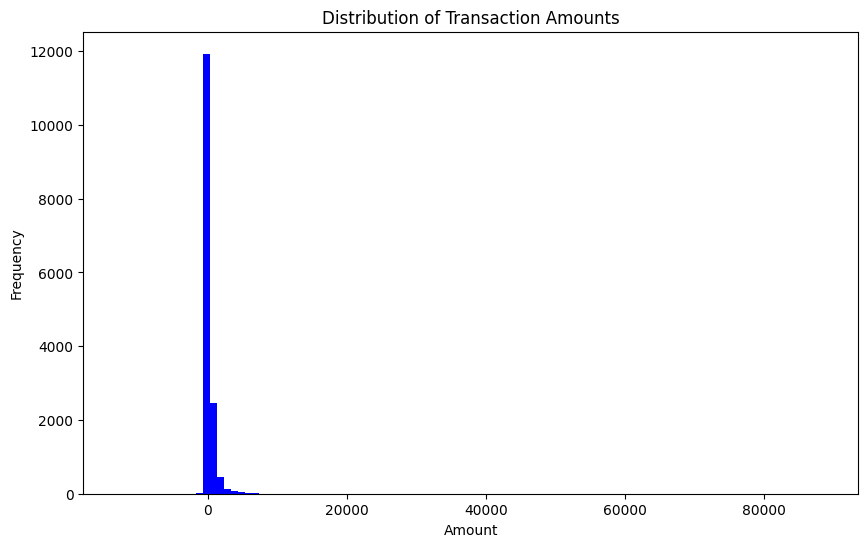

Top 3 bins with highest frequencies:
Bin edges: 7420.824000000004 - 8434.330200000004, Frequency: 5.0
Bin edges: 6407.317800000004 - 7420.824000000004, Frequency: 13.0
Bin edges: -1700.7317999999977 - -687.2255999999979, Frequency: 14.0
Bin edges: 5393.811600000005 - 6407.317800000004, Frequency: 16.0
Bin edges: 4380.305400000005 - 5393.811600000005, Frequency: 37.0
Bin edges: 3366.799200000003 - 4380.305400000005, Frequency: 80.0
Bin edges: 2353.2930000000033 - 3366.799200000003, Frequency: 121.0
Bin edges: 1339.7868000000035 - 2353.2930000000033, Frequency: 444.0
Bin edges: 326.28060000000187 - 1339.7868000000035, Frequency: 2463.0
Bin edges: -687.2255999999979 - 326.28060000000187, Frequency: 11931.0


In [65]:
import numpy as np
# Distribution of transaction amounts
plt.figure(figsize=(10, 6))
hist, bins, _ = plt.hist(data['AMT'], color='blue', bins=100)
plt.title('Distribution of Transaction Amounts')
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.show()

# Get bin edges and frequencies
bin_edges = bins[:-1]  # Exclude the last edge
frequencies = hist

# Sort bins by frequency and get top 3 and bottom 3
top_10_bins = np.argsort(frequencies)[-10:]

print("Top 3 bins with highest frequencies:")
for i in top_10_bins:
    print(f"Bin edges: {bin_edges[i]} - {bin_edges[i+1]}, Frequency: {frequencies[i]}")

Looks like majority of transaction amounts are between -687 to 326

A decent amount appear from 326 to 1339

Some from 1339 to 2353 and the bin size gets relatively small afterwards which could indicate some outliers.

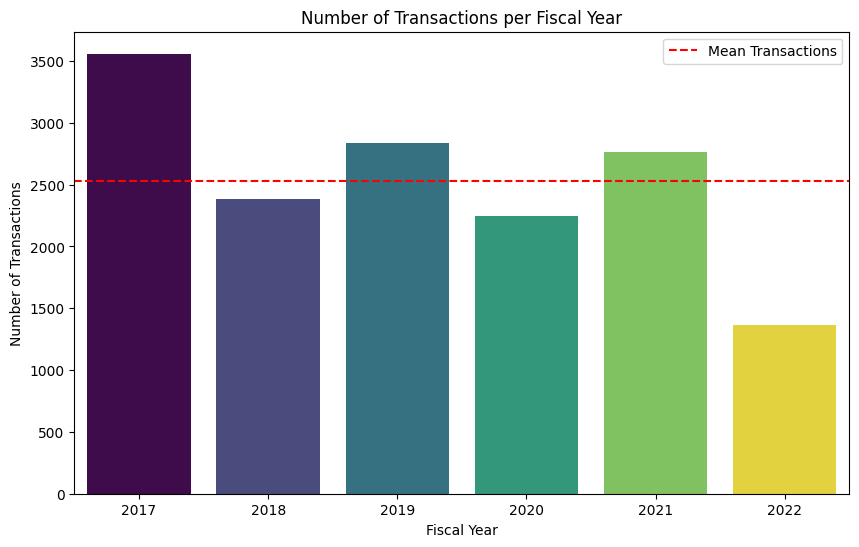

In [66]:
# Count of transactions per year
mean_transactions = data['FISCAL_YR'].value_counts().mean()

plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='FISCAL_YR', palette='viridis', hue='FISCAL_YR', legend=False)
plt.title('Number of Transactions per Fiscal Year')
plt.xlabel('Fiscal Year')
plt.ylabel('Number of Transactions')

# Add a horizontal line for the mean
plt.axhline(mean_transactions, color='red', linestyle='--', label='Mean Transactions')
plt.legend()

plt.show()

The number of transactions for the fiscal year follows a relatively consistent pattern, with fluctuations within a reasonable range.

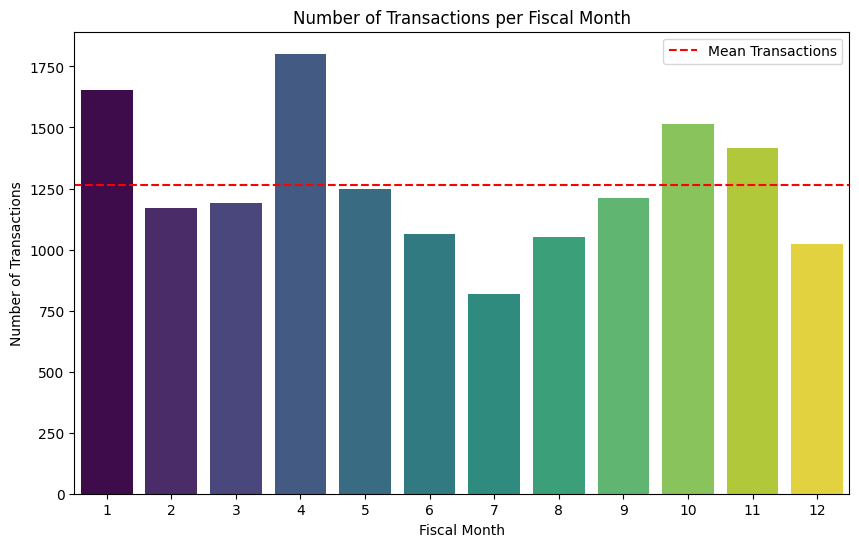

In [62]:
import matplotlib.pyplot as plt
# Calculate the mean number of transactions per month
mean_transactions = data['FISCAL_MTH'].value_counts().mean()

plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='FISCAL_MTH', palette='viridis', hue='FISCAL_MTH', legend=False)
plt.title('Number of Transactions per Fiscal Month')
plt.xlabel('Fiscal Month')
plt.ylabel('Number of Transactions')

# Add a horizontal line for the mean
plt.axhline(mean_transactions, color='red', linestyle='--', label='Mean Transactions')
plt.legend()

plt.show()

Looks like the transactions are distributed between the different fiscal months, with most months being slightly above or below the mean.

However, Fiscal Month 7 does have lesser columns, could indicate a seasonal dip in activity, ewer business operations.

Same for Fiscal Month 4 having more than the average, end of a financial quarter, promotional events.

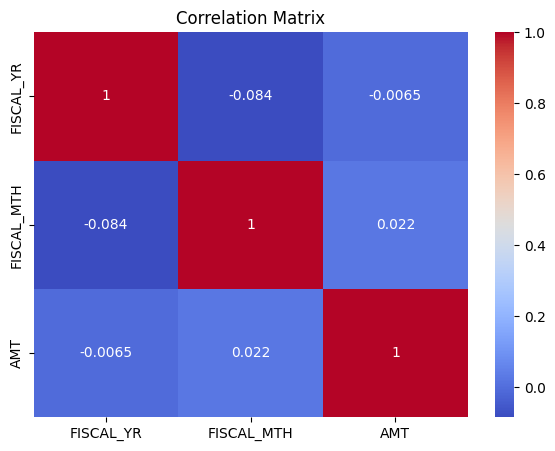

In [43]:
# Correlation matrix
plt.figure(figsize=(7, 5))
# Drop non-numerical columns before calculating correlation
corr_matrix = data.select_dtypes(include='number').corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Looks like there is no strong correlation between numeric columns and amount column. So we can conclude that the fiscal months and years do not greatly affect the amount.

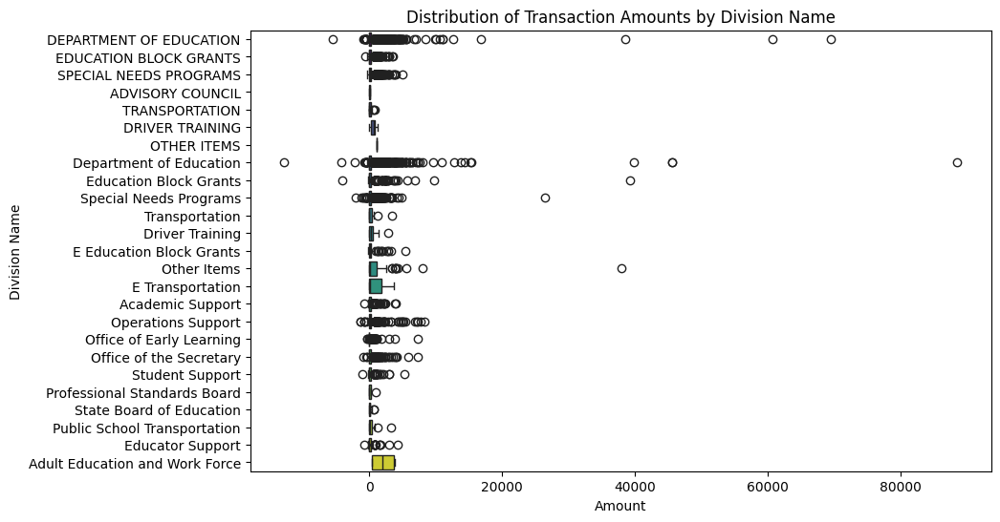

In [77]:
# Boxplot: Distribution of AMT by DIV_NAME
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='AMT', y='DIV_NAME', palette='viridis')
plt.title('Distribution of Transaction Amounts by Division Name')
plt.xlabel('Amount')
plt.ylabel('Division Name')
plt.show()

The box plots show a significant difference in the variability of transaction amounts across different divisions.

Several divisions have outliers like department of education, block grants special needs and other items, so lets keep a lookout after we model.

Divisions, like "E Transportation" and "Operations Support", have a concentrated distribution of transaction amounts (standardized spending)

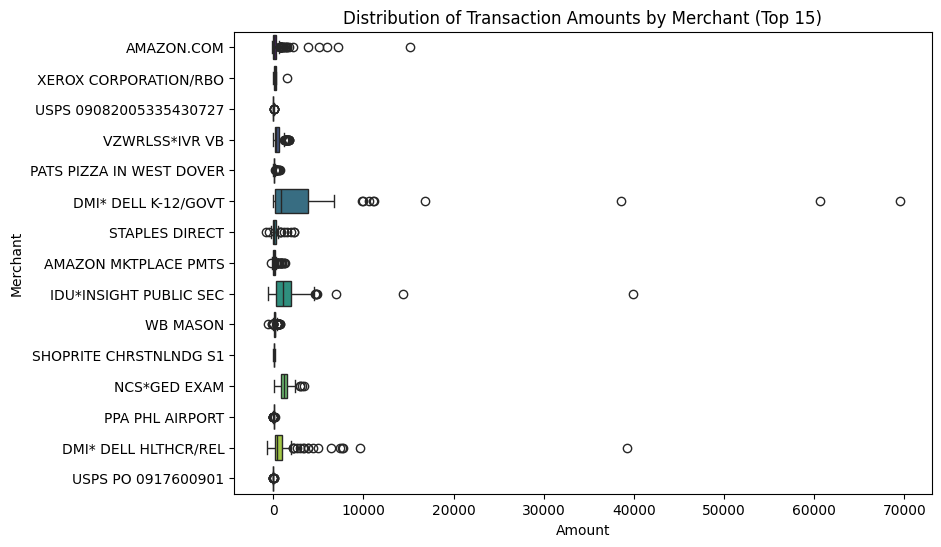

In [80]:
# Boxplot: Distribution of AMT by MERCHANT (top 15 merchants by transaction count)
top_merchants = data['MERCHANT'].value_counts().index[:15]
plt.figure(figsize=(9, 6))
sns.boxplot(data=data[data['MERCHANT'].isin(top_merchants)], x='AMT', y='MERCHANT', palette='viridis')
plt.title('Distribution of Transaction Amounts by Merchant (Top 15)')
plt.xlabel('Amount')
plt.ylabel('Merchant')
plt.show()

Merchants like DMI*DELL K-12/GOVT, DMI*DELL HLTHCR/REL and IDU*INSIGHT PUBLIC SEC do have some transactions with high transactions, leading to outliers. However, they also have high numbers of transactions which may offset the probability.

Merchants like STAPLES DIRECT have more concentrated transaction amounts and are less likely to be considered anomalies.

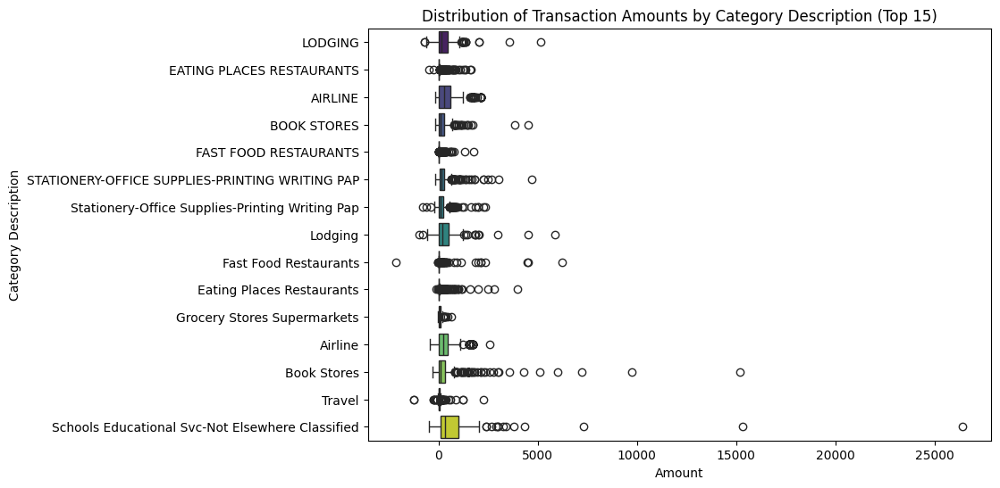

In [81]:
# Boxplot: Distribution of AMT by CAT_DESC (top 15 categories by transaction count)
top_categories = data['CAT_DESC'].value_counts().index[:15]
plt.figure(figsize=(9, 6))
sns.boxplot(data=data[data['CAT_DESC'].isin(top_categories)], x='AMT', y='CAT_DESC', palette='viridis')
plt.title('Distribution of Transaction Amounts by Category Description (Top 15)')
plt.xlabel('Amount')
plt.ylabel('Category Description')
plt.show()

Wide range of transaction amounts across the different category descriptions indicating significant variability

Categories, such as "Book Stores" and "School Educational Svs", have much higher transaction amounts compared to the rest

Some negative amount transactions from travels, fast food restaurants, airlines and lodging. I think that it is particularly suspicious why fast food restaurant has a large negaive amount given its relatively cheap food.

## Machine Learning pipeline using PyCaret

**Initialize Setup with additional preprocessing tasks**

In [4]:
rows_with_nan = data[data.isna().any(axis=1)]

# Then you can display the rows with NaN values
rows_with_nan

,FISCAL_YR,FISCAL_MTH,DEPT_NAME,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT
5154,2018,8,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,REDNERS MKTS #13,GROCERY STORES SUPERMARKETS,NaT,27.00
5155,2018,8,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,WB MASON,STATIONERY-OFFICE SUPPLIES-PRINTING WRITING PAP,NaT,203.68
5156,2018,8,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,WM SUPERCENTER #1736,GROCERY STORES SUPERMARKETS,NaT,21.79
5157,2018,8,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,XEROX CORPORATION/RBO,OFFICE PHOTOGRAPHIC PHOTOCOPY MICROFILM EQUIPMT,NaT,151.88


I have come to realise that there are some rows that have NaN values and we can't let the imputation in setup help us since it is a date column so we would need to manually drop it.

In [5]:
data = data.dropna()

In [6]:
from pycaret.anomaly import *
s = setup(data, session_id = 123,
          rare_to_value = 0.05,
          imputation_type = 'simple',
          numeric_features=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
          categorical_features=['DIV_NAME', 'MERCHANT', 'CAT_DESC'],
          date_features=['TRANS_DT'],
          ignore_features=['DEPT_NAME'],
          log_experiment = True, experiment_name = 'transactions'
)

,Description,Value
0,Session id,123
1,Original data shape,"(15152, 8)"
2,Transformed data shape,"(15152, 17)"
3,Ignore features,1
4,Numeric features,3
5,Date features,1
6,Categorical features,3
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


**Creating Different models**

For this assignment, we will be trying 3 different anomaly detection models
- **iforest**	(Isolation Forest)
- **lof**	(Local Outlier Factor)
- **mcd**	(Minimum Covariance Determinant)


In [7]:
iforest = create_model('iforest')

2024/08/25 05:09:39 WARNING mlflow.models.model: Input example should be provided to infer model signature if the model signature is not provided when logging the model.


In [8]:
lof = create_model('lof')

2024/08/25 05:09:43 WARNING mlflow.models.model: Input example should be provided to infer model signature if the model signature is not provided when logging the model.


In [9]:
knn = create_model('knn')

2024/08/25 05:09:47 WARNING mlflow.models.model: Input example should be provided to infer model signature if the model signature is not provided when logging the model.


**Assign Models**

- **iforest**

In [19]:
iforest_results = assign_model(iforest)
iforest_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,2016-06-03,-5.500000,0,-0.096510
1,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,18.309999,0,-0.022232
2,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,21.610001,0,-0.022792
3,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,22.389999,0,-0.022792
4,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,5.440000,0,-0.019908
...,...,...,...,...,...,...,...,...,...
15151,2022,6,Academic Support,ENTERPRISE RENT-A-CAR,Car Rental,2021-12-12,52.580002,0,-0.120636
15152,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,14.910000,0,-0.010449
15153,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,111.000000,0,-0.009269
15154,2022,6,Student Support,PESI,Schools Educational Svc-Not Elsewhere Classified,2021-12-05,99.989998,0,-0.110972


In [20]:
iforest_results['Anomaly'].value_counts()

Anomaly
0    14394
1      758
Name: count, dtype: int64

Looks like there is 756 anomalies detected, making up 4.98% of the total dataset

Lets go more indepth about the Anomaly Score and identify the threshold.

In [21]:
# Find the highest anomaly score
max_score = iforest_results['Anomaly_Score'].max()
print(f"Highest Anomaly Score: {max_score}")

# Find the lowest anomaly score
min_score = iforest_results['Anomaly_Score'].min()
print(f"Lowest Anomaly Score: {min_score}")

# Count the number of rows where the Anomaly_Score is negative
negative_scores_count = (iforest_results['Anomaly_Score'] < 0.0000000001).sum()
print(f"Number of rows with a negative Anomaly Score: {negative_scores_count}")

Highest Anomaly Score: 0.07230807443589982
Lowest Anomaly Score: -0.1577560148888934
Number of rows with a negative Anomaly Score: 14394


We can conclude that iforest would classify anomalies when the scores is greater than 0 (positive), the higher the score, the more obvious the anomaly is. Lets find the rows with the highest anomaly scores.

In [22]:
iforest_anomalies = iforest_results[iforest_results['Anomaly'] == 1]

iforest_anomalies_sorted = iforest_anomalies.sort_values(by='Anomaly_Score', ascending=False)

# Display the top 5 rows with the highest anomaly scores
iforest_anomalies_sorted.head(5)

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
13571,2021,12,Office of the Secretary,HILTON GARDEN INN DOVER,Lodging,2021-06-18,5856.500000,1,0.072308
13767,2021,12,Special Needs Programs,WESTIN LONG BEACH HOTEL,Lodging,2021-06-06,1055.199951,1,0.061397
14808,2022,4,Special Needs Programs,RESIDENCE INN ST. LOUI,Lodging,2021-10-06,1074.069946,1,0.059025
13809,2022,1,Office of the Secretary,HYATT REGENCY WASHINGTON,Lodging,2021-07-26,1185.300049,1,0.055787
7419,2019,6,Special Needs Programs,STAPLES DIRECT,Stationery-Office Supplies-Printing Writing Pap,2018-12-15,2259.300049,1,0.053206


Looks like these transactions fall under the merchant 'Redner's Wharehuse' in the Fiscal year of 2017 and have relatively high ammounts!

- **lof**

In [11]:
lof_results = assign_model(lof)
lof_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,2016-06-03,-5.500000,1,1.989182
1,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,18.309999,0,1.003991
2,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,21.610001,0,1.007659
3,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,22.389999,0,1.012851
4,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,5.440000,0,1.057732
...,...,...,...,...,...,...,...,...,...
15151,2022,6,Academic Support,ENTERPRISE RENT-A-CAR,Car Rental,2021-12-12,52.580002,0,1.023886
15152,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,14.910000,0,1.053978
15153,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,111.000000,0,0.995179
15154,2022,6,Student Support,PESI,Schools Educational Svc-Not Elsewhere Classified,2021-12-05,99.989998,0,1.006048


In [14]:
lof_results['Anomaly'].value_counts()

Anomaly
0    14394
1      758
Name: count, dtype: int64

Similar to iforest, there are 758 anomalies detected, making up 5% of the total dataset

Lets see what are the rows identified.

In [13]:
max_score = lof_results['Anomaly_Score'].max()
print(f"Highest Anomaly Score: {max_score}")

# Find the lowest anomaly score
min_score = lof_results['Anomaly_Score'].min()
print(f"Lowest Anomaly Score: {min_score}")

Highest Anomaly Score: 258127928206.62704
Lowest Anomaly Score: 0.9353593883609772


In [20]:
sorted_anomalies = anomalies.sort_values(by='Anomaly_Score', ascending=False)
sorted_anomalies

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
13785,2021,12,Special Needs Programs,AWL*PEARSON EDUCATION,Books Periodicals And Newspapers,2021-05-31,2085.500000,1,2.581279e+11
12804,2021,9,Student Support,NTLREST SERVSAFE,Business Services-Not Elsewhere Classified,2021-03-20,2088.000000,1,2.118749e+11
13169,2021,10,Education Block Grants,AMAZON.COM*MW60V66V1,Book Stores,2021-03-31,2140.199951,1,1.764580e+11
526,2017,2,DEPARTMENT OF EDUCATION,BOUNDLESSAT.COM,COMPUTERS COMPUTER PERIPHERAL EQUIPMENT SOFTWARE,2016-08-11,2100.000000,1,1.668788e+11
7277,2019,6,Department of Education,ARAMARK CONRAD CAFE,Fast Food Restaurants,2018-12-02,2131.409912,1,1.644559e+11
...,...,...,...,...,...,...,...,...,...
8701,2019,12,Department of Education,UPS*1Z21X9566692400985,Freight Carrier Trucking-Lcl-Lng Dist Mvg-Storage,2019-06-11,31.090000,0,1.046897e+00
7972,2019,9,Department of Education,WB MASON,Stationery-Office Supplies-Printing Writing Pap,2019-03-24,120.599998,0,1.046889e+00
5121,2018,8,DEPARTMENT OF EDUCATION,AMAZON MKTPLACE PMTS,BOOK STORES,2018-02-21,11.650000,0,1.046883e+00
13483,2021,11,Education Block Grants,AMAZON.COM*MN9VZ0VQ1,Book Stores,2021-05-15,16.980000,0,1.046882e+00


yeap looks like the higher the anomaly score, the more likely it is an anomaly.

- **knn**

In [26]:
knn_results = assign_model(knn)
knn_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,2016-06-03,-5.500000,0,7.362235
1,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,18.309999,0,2.553919
2,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,21.610001,0,2.064001
3,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,22.389999,0,2.122287
4,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,5.440000,0,2.385141
...,...,...,...,...,...,...,...,...,...
15151,2022,6,Academic Support,ENTERPRISE RENT-A-CAR,Car Rental,2021-12-12,52.580002,0,4.174255
15152,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,14.910000,0,2.548804
15153,2022,6,Academic Support,COURTYARD BY MARRIOTT-,Lodging,2021-12-13,111.000000,0,5.340262
15154,2022,6,Student Support,PESI,Schools Educational Svc-Not Elsewhere Classified,2021-12-05,99.989998,0,4.469910


In [27]:
knn_results['Anomaly'].value_counts()

Anomaly
0    14394
1      758
Name: count, dtype: int64

In [43]:
max_score = knn_results['Anomaly_Score'].max()
print(f"Highest Anomaly Score: {max_score}")

# Find the lowest anomaly score
min_score = knn_results['Anomaly_Score'].min()
print(f"Lowest Anomaly Score: {min_score}")

Highest Anomaly Score: 48643.39898228101
Lowest Anomaly Score: 0.0


In [37]:
knn_anomalies = knn_results[knn_results['Anomaly'] == 1]

# Print the top 5 rows where Anomaly == 1
knn_anomalies.head(5)

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT,Anomaly,Anomaly_Score
27,2017,1,DEPARTMENT OF EDUCATION,WHOLESALE JANITOR,INDUSTRIAL SUPPLIES NOT ELSEWHERE CLASSIFIED,2016-06-27,1999.000000,1,12.328828
79,2017,1,DEPARTMENT OF EDUCATION,WESTIN SWAN,LODGING,2016-06-30,1006.900024,1,13.142392
139,2017,1,DEPARTMENT OF EDUCATION,MARRIOTT 33787 COPLEY PL,LODGING,2016-07-04,1229.160034,1,12.365526
140,2017,1,DEPARTMENT OF EDUCATION,MARRIOTT 33787 COPLEY PL,LODGING,2016-07-04,1229.160034,1,12.365526
166,2017,1,DEPARTMENT OF EDUCATION,AMAZON.COM,BOOK STORES,2016-07-08,-179.000000,1,13.446025


**Analyse Models**

Lets see the different threshold at which the model determines that certain datapoints are considered anomalies.

From our EDA above, DEPT_NAME and AMT looks like the feature that will affect outliers the most so lets include it.

- **iforest**

In [28]:
plot_model(iforest, plot = 'tsne', feature='AMT')

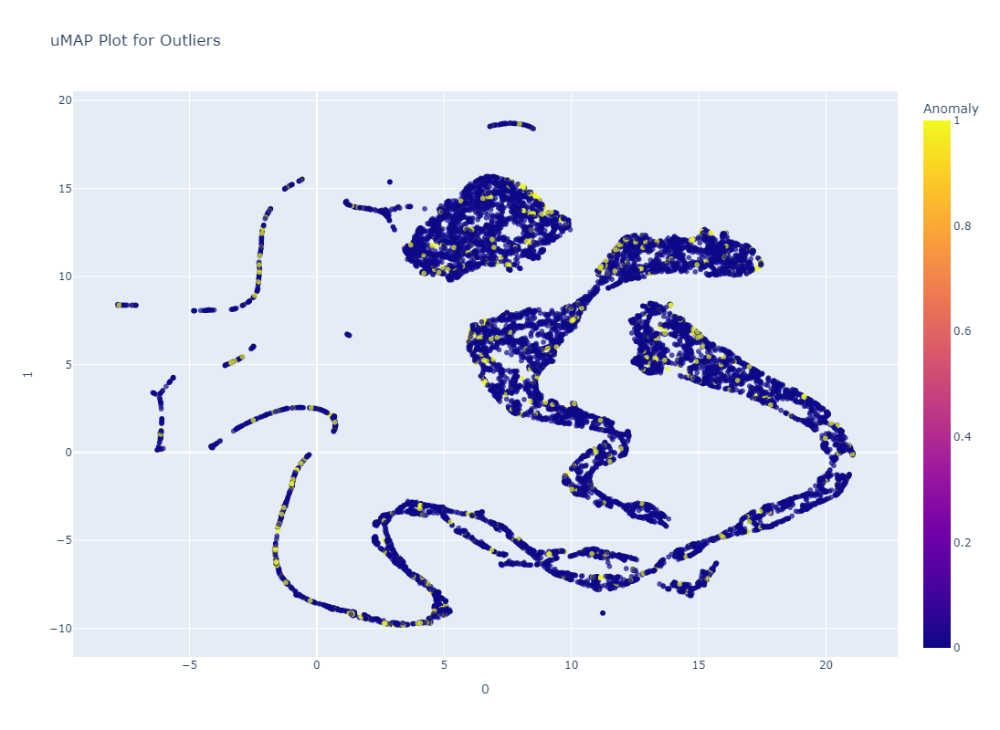

In [39]:
plot_model(iforest, plot = 'umap')

in this umap plot, the outliers look quite scattered with no clear distinction

In [29]:
evaluate_model(iforest)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

- **lof**

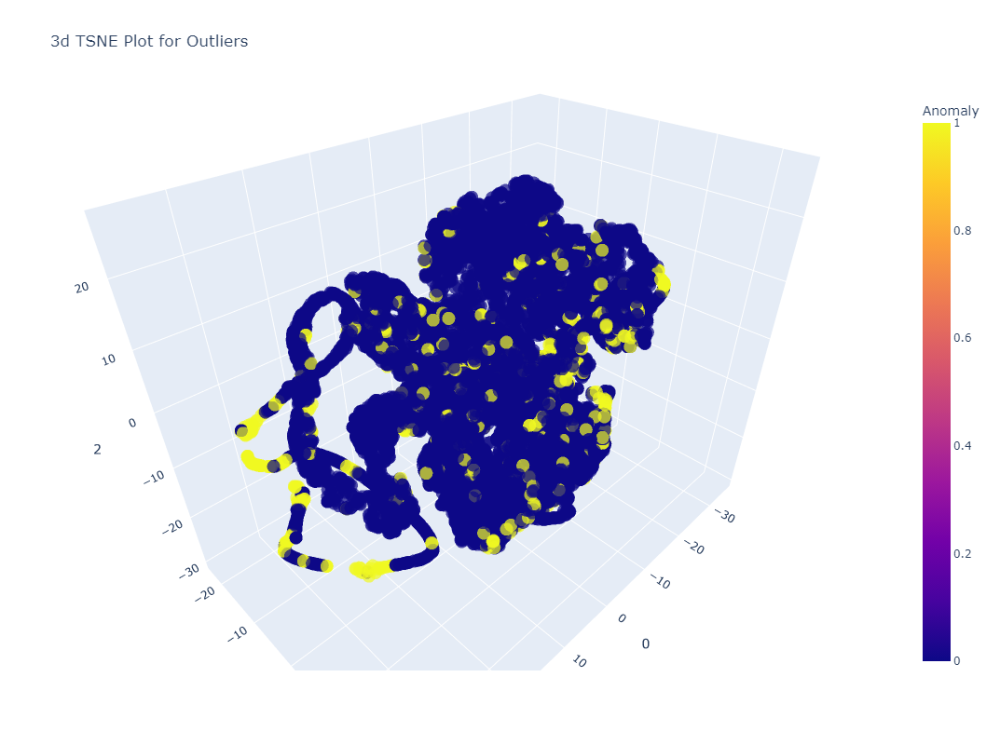

In [30]:
plot_model(lof, plot = 'tsne', feature='AMT')

In [40]:
plot_model(lof, plot = 'umap')

In this umap, the anomalies looked slight more distinguished than the iforest model as the outliers are mostly found near the edge of the lines / clusters / tunnels?

In [31]:
evaluate_model(lof)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

- **knn**

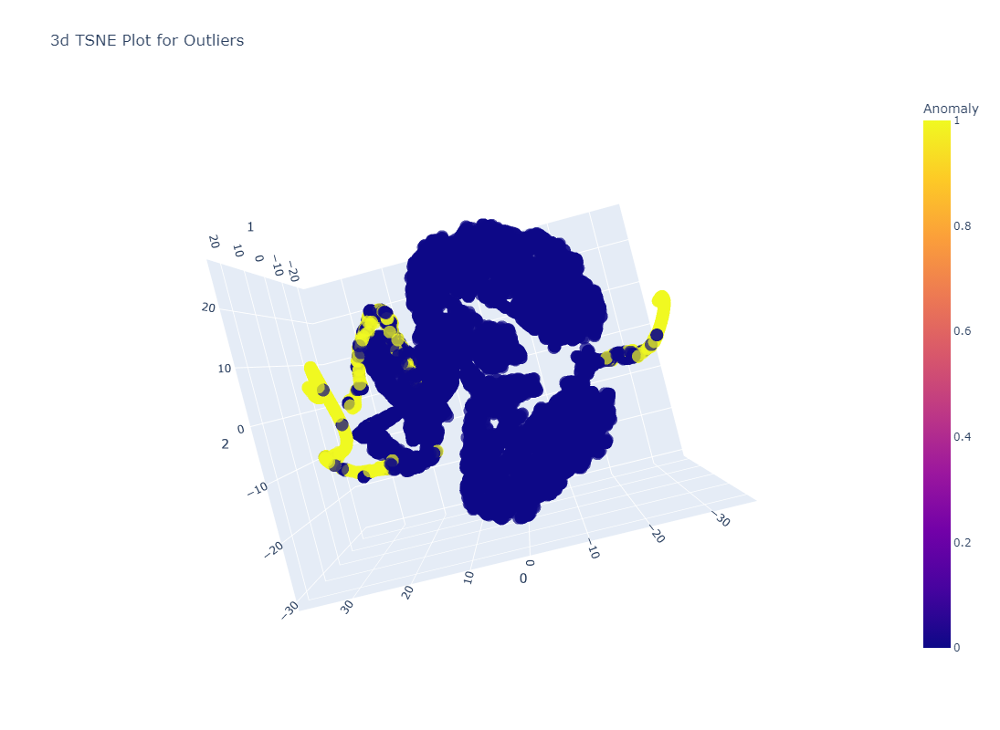

In [32]:
plot_model(knn, plot = 'tsne', feature='AMT')

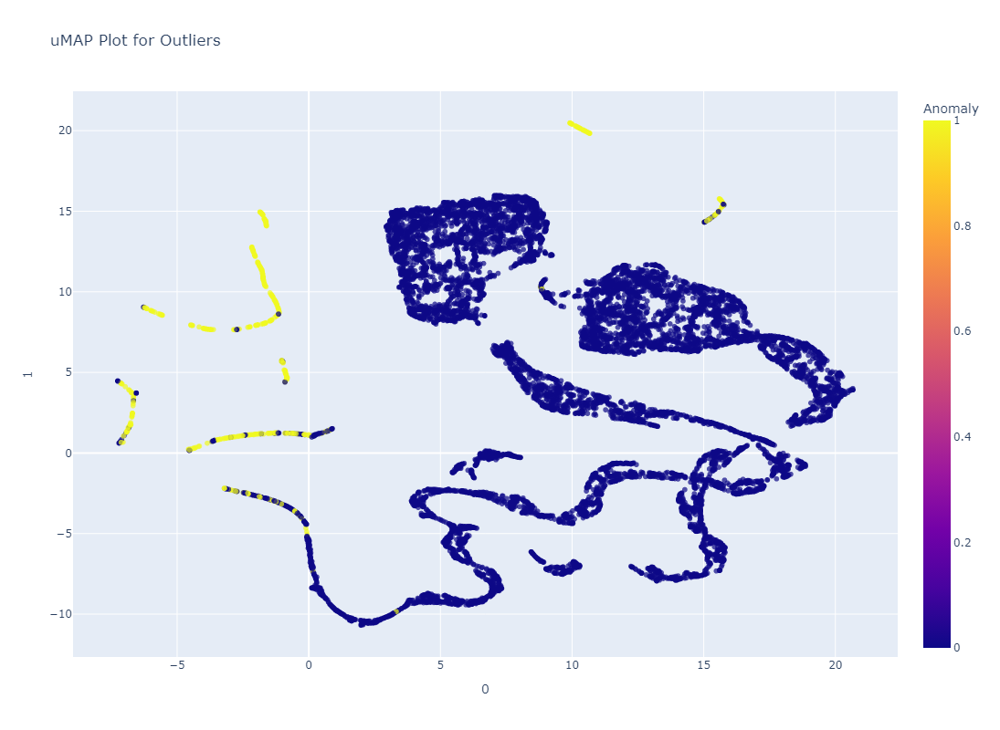

In [41]:
plot_model(knn, plot = 'umap')

in this umap, the outliers are clearly seperated from the rest of the datapoints, most anomalies on the left and clustered together and in batches. this looks good.

In [33]:
evaluate_model(knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

So from the 3 models above, the model that we will move forward with prediction is knn (k-nearest neighbouts) since it consistently identifies anomalies that align with domain-specific patterns of fraud and unexpected behavior within the dataset.

**Prediction**

Lets test this model with the dataset and see which transactions are labeled anomaly.

In [34]:
data_pred = data.copy()
data_pred.drop(columns='DEPT_NAME', inplace=True)

In [35]:
knn_pred = predict_model(knn, data=data_pred)
knn_pred

,FISCAL_YR,FISCAL_MTH,DIV_NAME_DEPARTMENT OF EDUCATION,DIV_NAME_rare,DIV_NAME_Department of Education,DIV_NAME_Special Needs Programs,DIV_NAME_Office of the Secretary,MERCHANT_rare,CAT_DESC_rare,CAT_DESC_EATING PLACES RESTAURANTS,CAT_DESC_Stationery-Office Supplies-Printing Writing Pap,CAT_DESC_Lodging,CAT_DESC_Eating Places Restaurants,TRANS_DT_year,TRANS_DT_month,TRANS_DT_day,AMT,Anomaly,Anomaly_Score
0,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2016,6,3,-5.50,0,7.085647
1,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,2016,6,26,18.31,0,2.533002
2,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,2016,6,26,21.61,0,2.018143
3,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,2016,6,26,22.39,0,2.064001
4,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,2016,6,26,5.44,0,2.071618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15151,2022.0,6.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2021,12,12,52.58,0,4.047519
15152,2022.0,6.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2021,12,13,14.91,0,2.361694
15153,2022.0,6.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2021,12,13,111.00,0,5.172583
15154,2022.0,6.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2021,12,5,99.99,0,4.000000


**Save Model**

In [36]:
save_model(knn, 'knn_pipeline1')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('date_feature_extractor',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=ExtractDateTimeFeatures())),
                 ('numerical_imputer',
                  TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['DIV_NAME', 'MERCHANT',
                                              'CAT_DESC'],
                                     tra...
                 ('onehot_encoding',
                  TransformerWrapper(include=['DIV_NAME', 'MERCHANT',
                                              'CAT_DESC'],
                                     transformer=OneHotEncoder(cols=['DIV_NAME',
                                                                     'MERCHANT',
                                                 

**Experiment logging**

Let’s initiate the MLflow server

In [ ]:
import mlflow

mlflow.set_tracking_uri("http://127.0.0.1:5000")

In [ ]:
!mlflow ui